In [1]:
%%bash
curl -o "setup.sh" https://raw.githubusercontent.com/Synthesis-AI-Dev/face_api_dataset_examples/main/setup.sh
chmod a+x setup.sh
./setup.sh

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1281  100  1281    0     0   2923      0 --:--:-- --:--:-- --:--:--  3021
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   241  100   241    0     0    641      0 --:--:-- --:--:-- --:--:--   669


  Cloning https://github.com/Synthesis-AI-Dev/face_api_dataset.git (to revision 058ebef3) to /private/var/folders/4h/2fr255s9115drx7nckt7bb6m0000gp/T/tmp.wsBKI8Ke/pip-req-build-75py7dv_


  Running command git clone -q https://github.com/Synthesis-AI-Dev/face_api_dataset.git /private/var/folders/4h/2fr255s9115drx7nckt7bb6m0000gp/T/tmp.wsBKI8Ke/pip-req-build-75py7dv_
  Running command git checkout -q 058ebef3


  Resolved https://github.com/Synthesis-AI-Dev/face_api_dataset.git to commit 058ebef3
git lfs is already installed


Cloning into 'face_api_dataset_examples'...
Filtering content: 100% (705/705), 300.15 MiB | 1.55 MiB/s, done.


In [2]:
%matplotlib inline

In [3]:
from typing import Tuple, Dict, Sequence

import cv2
import numpy as np
import matplotlib.pyplot as plt
from face_api_dataset import FaceApiDataset, Modality

In [4]:
def extract_points(landmark_dict: dict, landmark_idx: Sequence[int]) -> np.ndarray:
    landmarks = {k: landmark_dict[int(k)] for k in landmark_idx}
    points = [(int(x), int(y)) for x, y in landmarks.values()]
    return np.array(points)


def get_segments_mask(segments_img: np.ndarray, segment_names: Sequence[str]) -> np.ndarray:
    segment_ids = [FaceApiDataset.SEGMENTS[n] for n in segment_names]
    mask = np.isin(segments_img, segment_ids)

    return mask


def mask_from_points(img_hw: Tuple[int, int], points: np.ndarray) -> np.ndarray:
    image = np.zeros(img_hw, dtype=np.uint8)
    mask = cv2.fillPoly(image, [points], color=[1, 1, 1])

    return mask


def get_accessory_mask(segments_img: np.ndarray,
                       segment_names: Sequence[str] =
                       ("glasses_frame", "glasses_lens_left", "glasses_lens_right", "headphones", "headwear", "mask")
                       ) -> np.ndarray:
    return get_segments_mask(segments_img, segment_names)


def get_centroid(mask: np.ndarray) -> Tuple[int, int]:
    moments = cv2.moments(mask.astype(np.uint8))
    x = int(moments["m10"] / moments["m00"])
    y = int(moments["m01"] / moments["m00"])

    return x, y


Bbox = Tuple[int, int, int, int]
Point = Tuple[int, int]


def extract_roi(segments_img: np.ndarray, landmark_dict: dict, landmark_idxs: Sequence[int]
               ) -> Tuple[Bbox, Point, Dict[str, float]]:
    key_points = extract_points(landmark_dict, landmark_idxs)
    img_hw = segments_img.shape
    seg_mask = mask_from_points(img_hw, key_points)

    region_bbox = cv2.boundingRect(seg_mask.astype(np.uint8))
    cnt = get_centroid(seg_mask)
    
    acc_mask = get_accessory_mask(segments_img)
    hair_mask = get_segments_mask(segments_img, ["hair", "beard", "mustache"])
    clothes_mask = get_segments_mask(segments_img, ["clothing"])
    
    segment_vol = seg_mask.sum()
    acc_occlusion = (seg_mask & acc_mask).sum() / segment_vol if segment_vol else 0
    hair_occlusion = (seg_mask & hair_mask).sum() / segment_vol if segment_vol else 0
    clothes_occlusion = (seg_mask & clothes_mask).sum() / segment_vol if segment_vol else 0
    occlusion = {"accessories": acc_occlusion, "hair": hair_occlusion, "clothing": clothes_occlusion}
    
    return region_bbox, cnt, occlusion


def plot_bbox(image: np.ndarray, bbox: Tuple[int, int, int, int]) -> np.ndarray:
    x, y, w, h = bbox
    x0, y0, x1, y1 = x, y, x + w, y + h
    image = cv2.rectangle(image.copy(), (x0, y0), (x1, y1), (255, 0, 0), 2)
    return image


def plot_centroid(cx: int, cy: int, image: np.ndarray) -> np.ndarray:
    out = cv2.circle(image.copy(), (cx, cy), 5, (0, 255, 0), -1)
    return out

In [5]:
data_root = "test_dataset"
dataset = FaceApiDataset(data_root,
                        modalities=[Modality.RGB, Modality.LANDMARKS_IBUG68, Modality.SEGMENTS,
                                    Modality.SCENE_ID])

In [6]:
params = [("Right eye", range(36, 42)),
          ("Left eye", range(42, 48)),
          ("Nose", range(27, 36)),
          ("Mouth with lips", range(48, 68)),
          ("Inner mouth", range(60, 68))]

In [7]:
def landmark_show(img, landmarks, radius=2, labels=True, font_scale=0.25):
    l_img = np.copy(img)
    for name, (x, y) in landmarks.items():
        int_p = (int(x), int(y))
        cv2.circle(l_img, int_p, radius=radius, color=(255, 0, 0), thickness=cv2.FILLED)
        if labels:
            l_img = cv2.putText(l_img, str(name), int_p, cv2.FONT_HERSHEY_SIMPLEX,
                                font_scale, (0, 255, 0), 1, cv2.LINE_AA)

    plt.imshow(l_img)

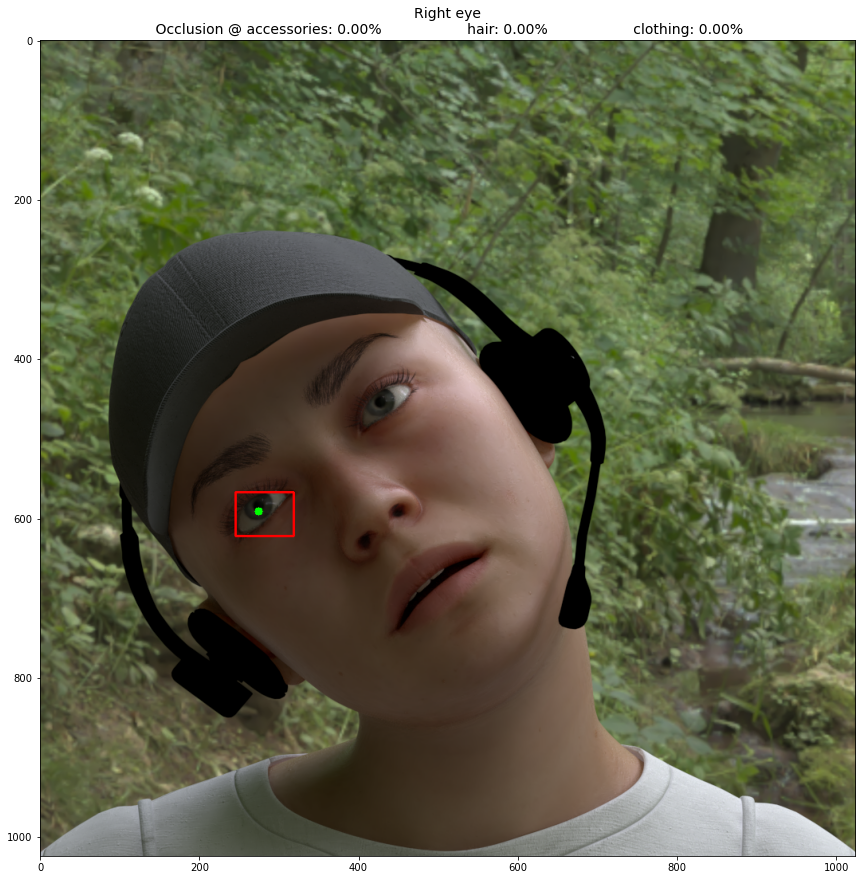

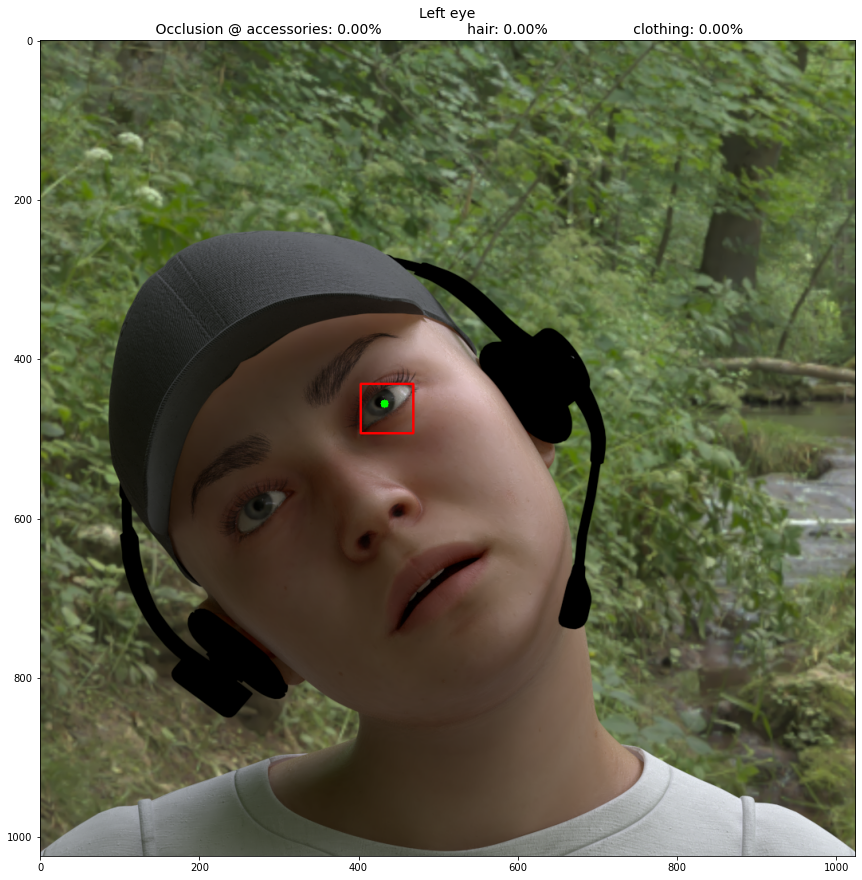

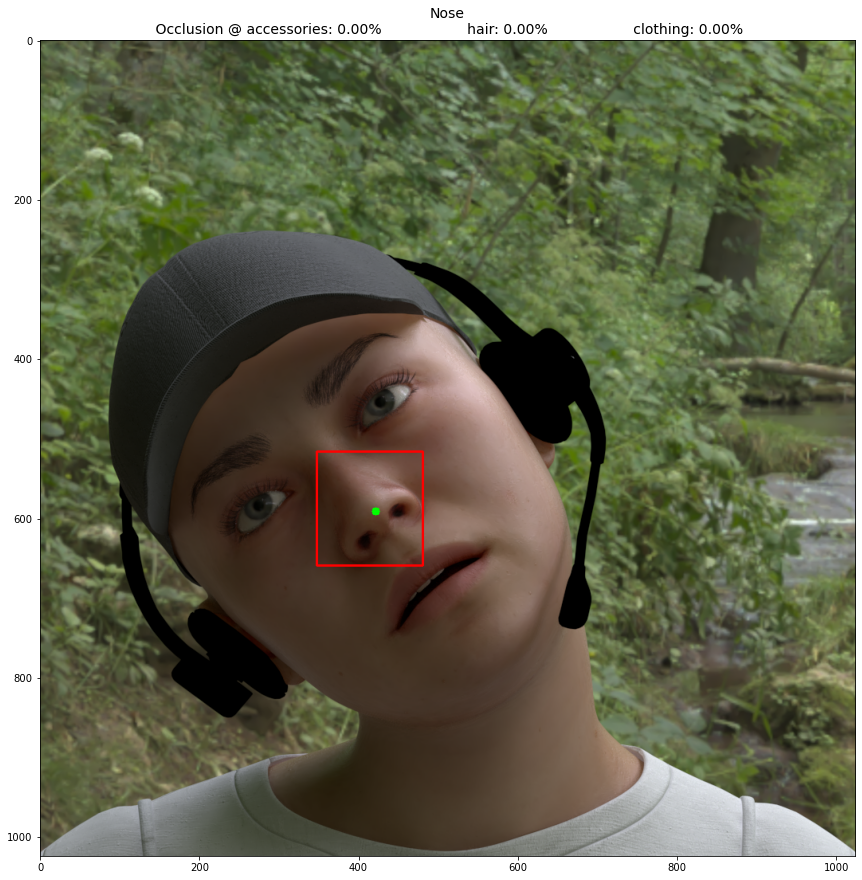

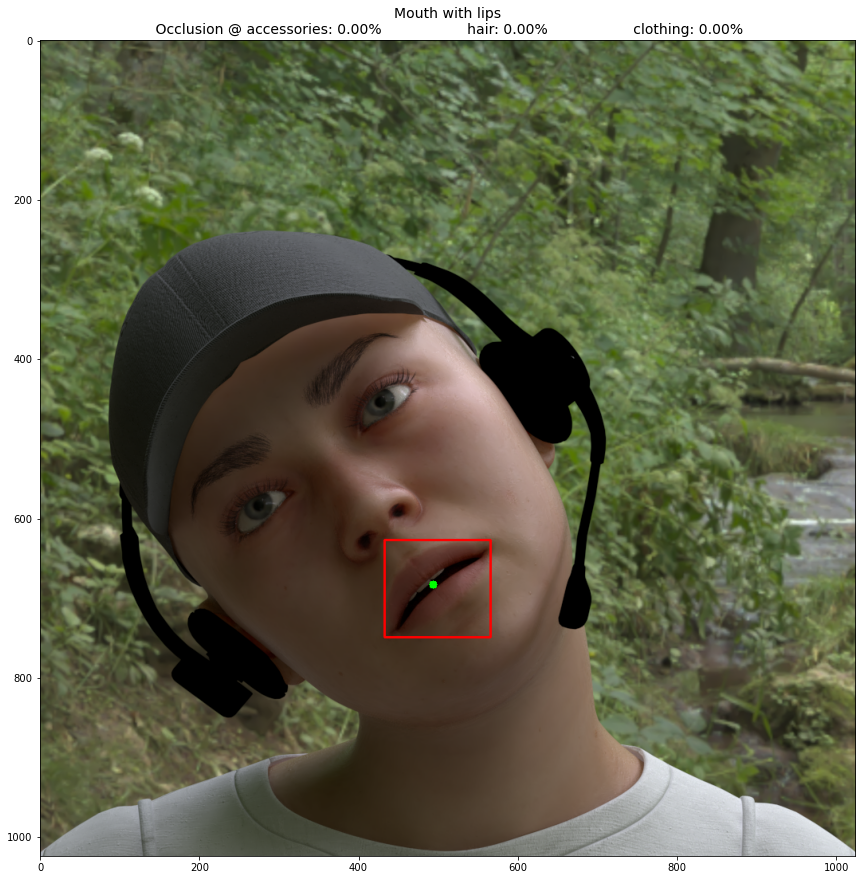

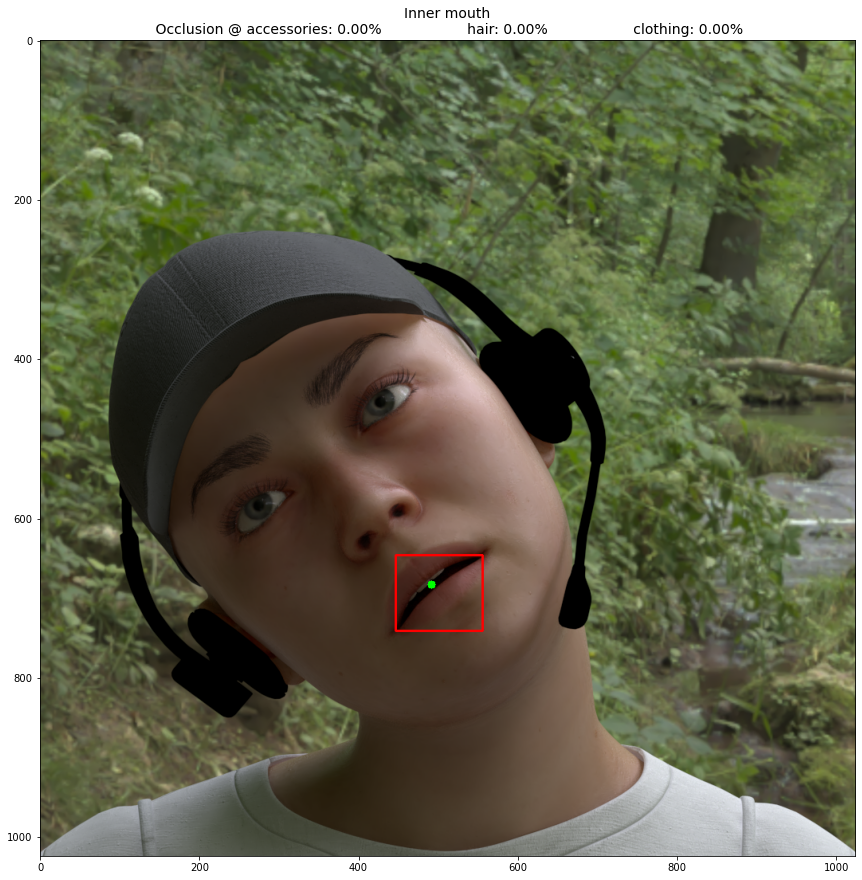

...

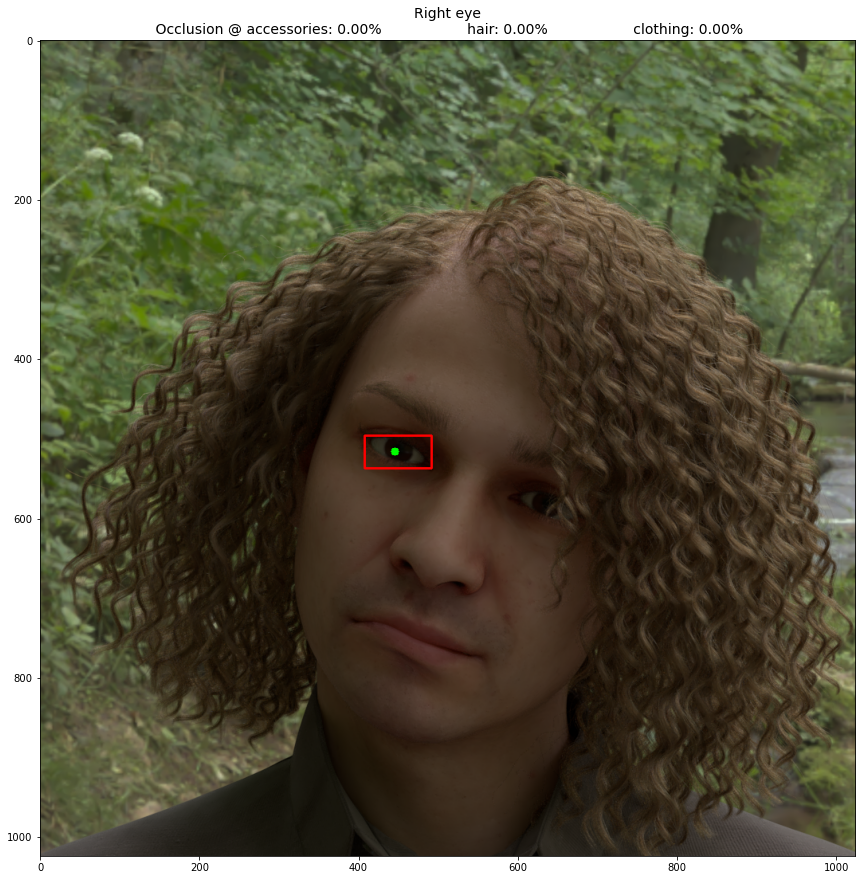

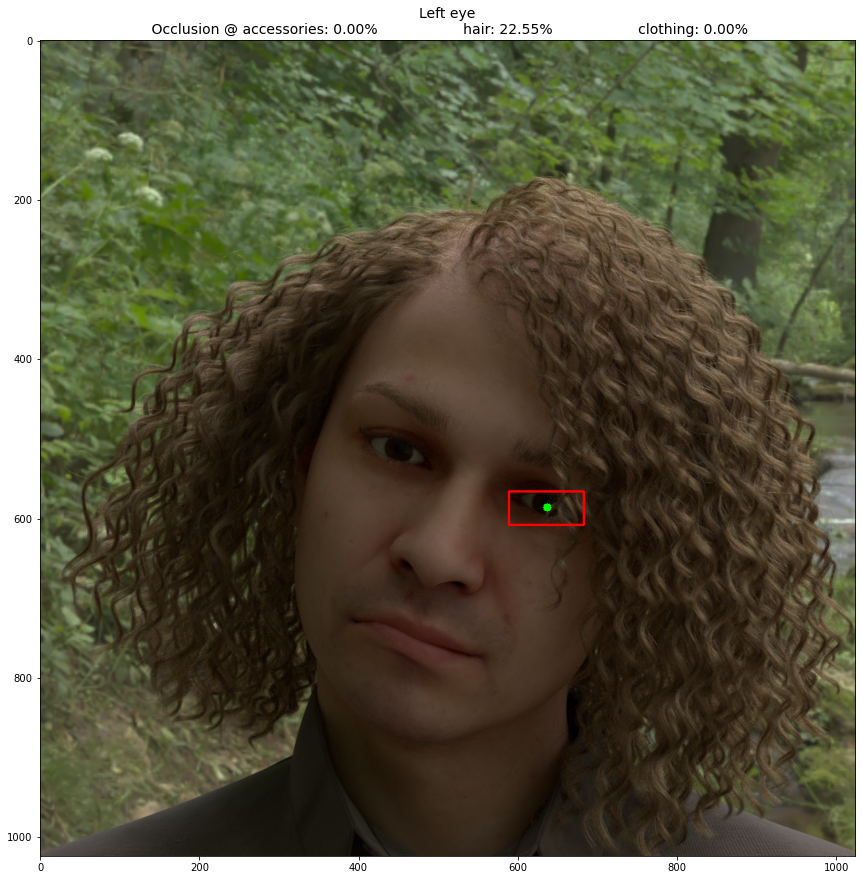

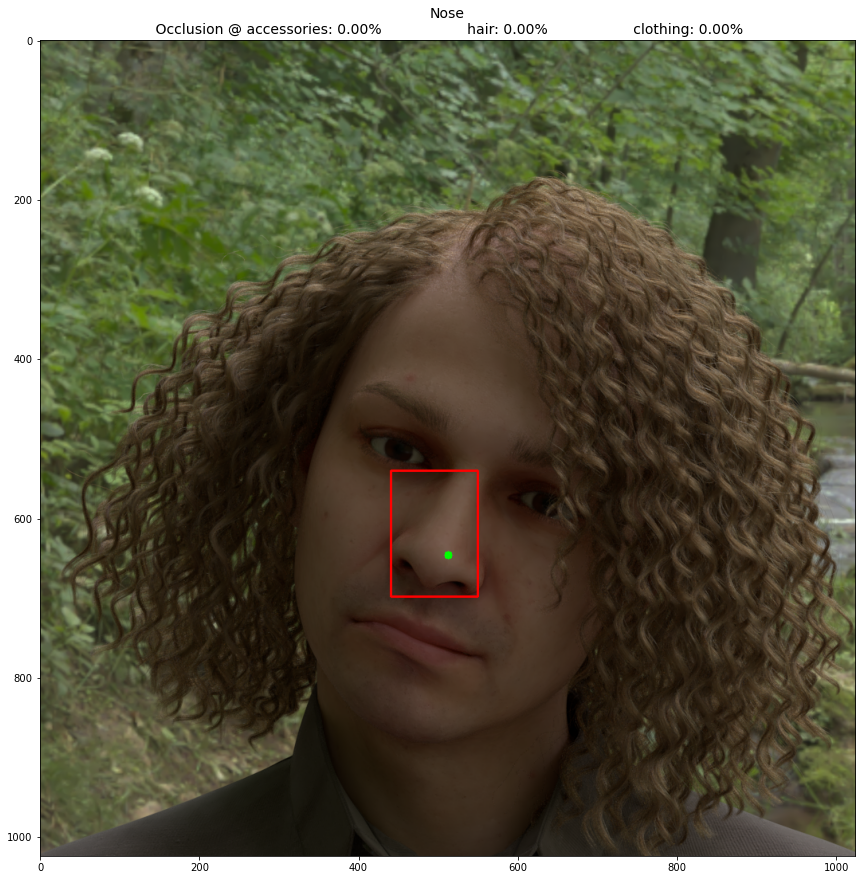

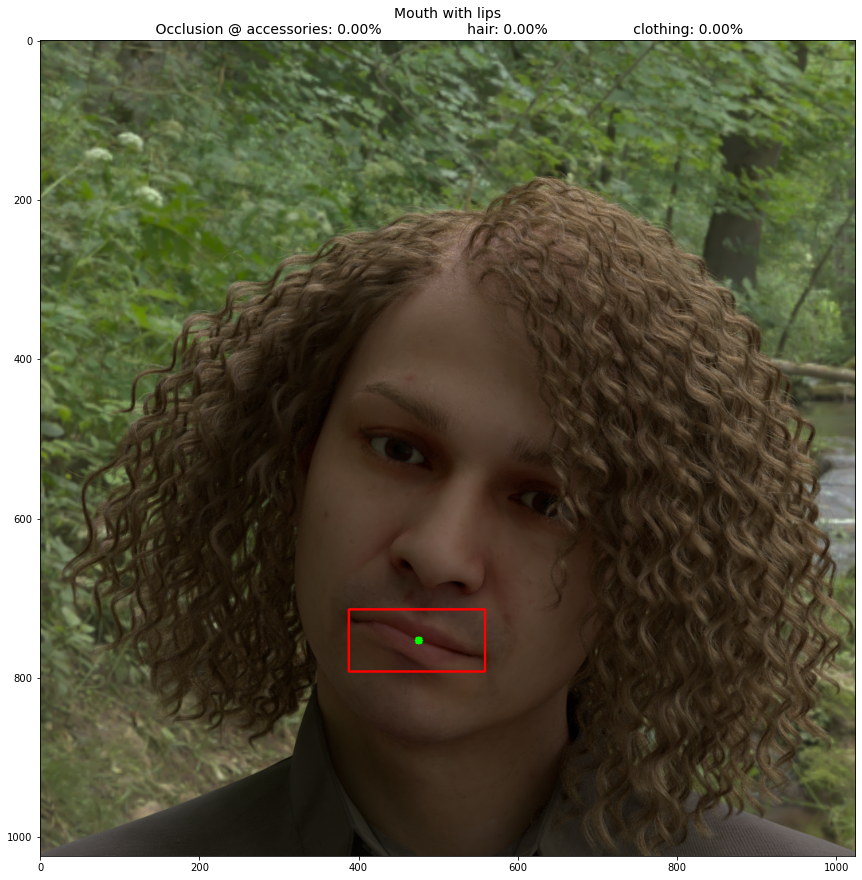

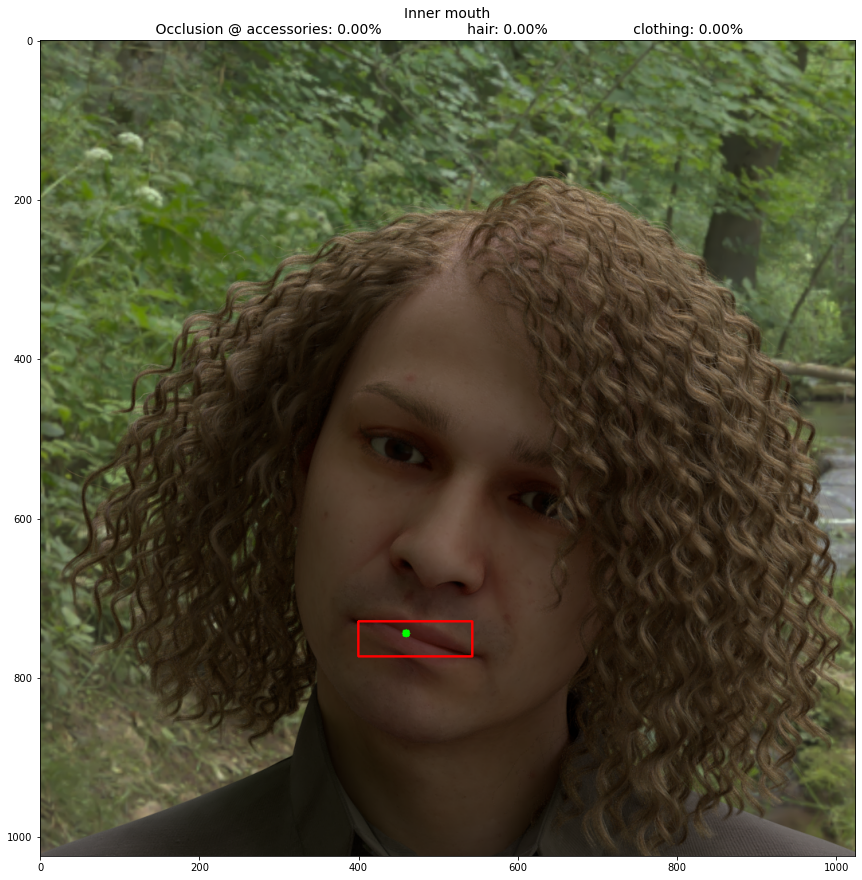

In [8]:
for item in (dataset[0], dataset[1], dataset[2]):

    for name, landmark_idxs in params:
        region_bbox, centroid, occlusion = extract_roi(item[Modality.SEGMENTS], item[Modality.LANDMARKS_IBUG68], landmark_idxs)

        rgb_img = item[Modality.RGB]
        rgb_img_bbox = plot_bbox(rgb_img, region_bbox)
        rgb_img_bbox_cnt = plot_centroid(*centroid, rgb_img_bbox)

        plt.figure(figsize=(15, 15))
        plt.title(f"{name}\n Occlusion @ accessories: {occlusion['accessories'] * 100:.2f}% \
                  hair: {occlusion['hair'] * 100:.2f}% \
                  clothing: {occlusion['clothing'] * 100:.2f}%", fontsize=14)

        plt.imshow(rgb_img_bbox_cnt)